# 🌍 Earthquake Data Analysis with Python

This project explores global earthquake data using Python libraries such as Pandas, Matplotlib, Folium, and Geopandas. We clean and preprocess the data, perform exploratory data analysis (EDA), and visualize geographic and statistical patterns in earthquake activity.

---

## 📥 1. Load & Explore the Data
We begin by importing the dataset and inspecting the first few rows to understand the structure of the data, including key columns like location, time, magnitude, and depth.

In [ ]:
# Library imports
# This script uses several libraries to perform data analysis and visualization

import pandas as pd # Pandas is used to load and manipulate data in table format (DataFrames)
import matplotlib.pyplot as plt # Matplotlib is a library to create visual plots such as histograms, bar charts, etc.
import geopandas as gpd # Geopandas extends Pandas to allow spatial operations on geometric types
import folium # Folium is used to create interactive Leaflet maps in Python
from datetime import datetime # Datetime is used to handle date and time data

# Load CSV
def load_data(path):
    return pd.read_csv(path)

data = load_data('earthquakes.csv')
data.head()

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2025-05-02T02:50:02.380Z,33.912167,-117.070000,12.690000,0.89,ml,33.0,116.0,NaN,0.20,...,2025-05-02T02:53:47.574Z,"9 km S of Calimesa, CA",earthquake,0.31,1.31,0.167,28.0,automatic,ci,ci
1,2025-05-02T02:39:31.940Z,33.073667,-116.801333,9.340000,0.82,ml,5.0,168.0,0.1396,0.15,...,2025-05-02T02:42:55.817Z,"7 km ENE of Ramona, CA",earthquake,3.87,10.42,0.388,9.0,automatic,ci,ci
2,2025-05-02T02:36:43.010Z,59.731200,-151.989200,58.700000,1.90,ml,NaN,NaN,NaN,0.98,...,2025-05-02T02:38:45.940Z,"10 km WSW of Anchor Point, Alaska",earthquake,NaN,0.90,NaN,NaN,automatic,ak,ak
3,2025-05-02T02:33:57.040Z,33.815500,-116.828833,29.800000,1.17,ml,15.0,208.0,0.1857,0.17,...,2025-05-02T02:37:27.431Z,"10 km NE of Valle Vista, CA",earthquake,1.57,0.91,0.307,33.0,automatic,ci,ci
4,2025-05-02T02:32:14.770Z,19.569666,-155.366669,60.099998,2.63,ml,8.0,149.0,0.0935,0.32,...,2025-05-02T02:35:58.840Z,"19 km NW of Volcano, Hawaii",earthquake,2.98,4.89,0.730,4.0,automatic,hv,hv


## 🧹 2. Clean & Preprocess the Data
We clean the dataset by removing rows with missing or invalid values and extract useful features such as the location name from the place column. This step ensures the quality and usability of the data for analysis.

In [61]:
def clean_data(df):
    df = df.dropna(subset=['latitude', 'longitude', 'mag'])
    df = df[df['mag'] > 0]
    df['time'] = pd.to_datetime(df['time'], errors='coerce')
    df['location'] = df['place'].apply(lambda x: str(x).split(',')[-1].strip() if ',' in str(x) else None)
    df = df[df['location'].notna()]
    return df

filtered_data = clean_data(data)
filtered_data.head()

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource,location
0,2025-05-02 02:50:02.380000+00:00,33.912167,-117.070000,12.690000,0.89,ml,33.0,116.0,NaN,0.20,...,"9 km S of Calimesa, CA",earthquake,0.31,1.31,0.167,28.0,automatic,ci,ci,CA
1,2025-05-02 02:39:31.940000+00:00,33.073667,-116.801333,9.340000,0.82,ml,5.0,168.0,0.1396,0.15,...,"7 km ENE of Ramona, CA",earthquake,3.87,10.42,0.388,9.0,automatic,ci,ci,CA
2,2025-05-02 02:36:43.010000+00:00,59.731200,-151.989200,58.700000,1.90,ml,NaN,NaN,NaN,0.98,...,"10 km WSW of Anchor Point, Alaska",earthquake,NaN,0.90,NaN,NaN,automatic,ak,ak,Alaska
3,2025-05-02 02:33:57.040000+00:00,33.815500,-116.828833,29.800000,1.17,ml,15.0,208.0,0.1857,0.17,...,"10 km NE of Valle Vista, CA",earthquake,1.57,0.91,0.307,33.0,automatic,ci,ci,CA
4,2025-05-02 02:32:14.770000+00:00,19.569666,-155.366669,60.099998,2.63,ml,8.0,149.0,0.0935,0.32,...,"19 km NW of Volcano, Hawaii",earthquake,2.98,4.89,0.730,4.0,automatic,hv,hv,Hawaii


## 📊 3. Exploratory Data Analysis (EDA)
### A. Earthquake Magnitude Distribution
Most earthquakes have a magnitude between 0 and 3, which indicates that the dataset contains a high number of minor seismic events. There are significantly fewer earthquakes above magnitude 5, and very few strong quakes (above magnitude 6 or 7).

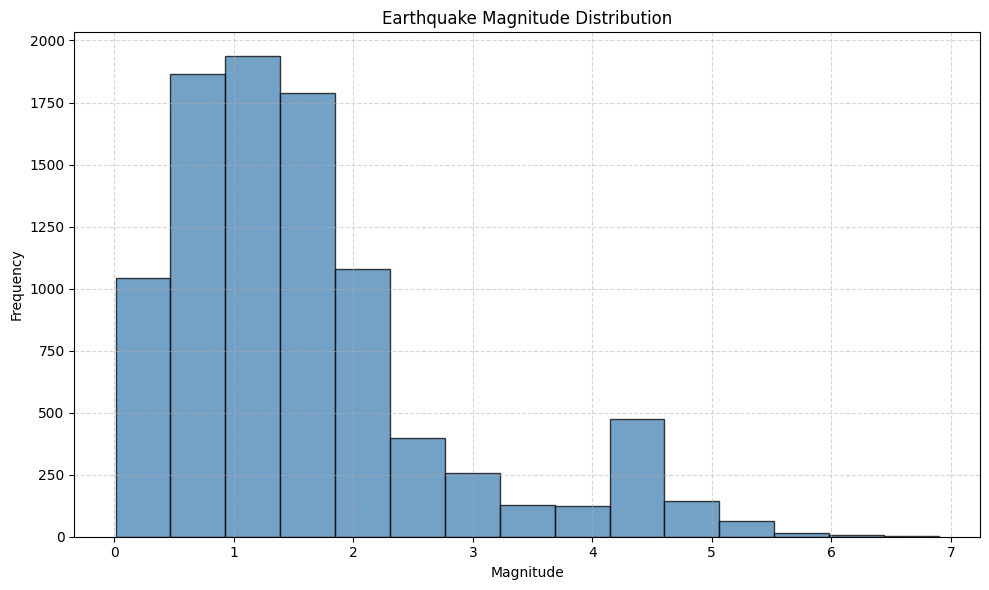

In [62]:
plt.figure(figsize=(10, 6))
plt.hist(filtered_data['mag'], bins=15, color='steelblue', edgecolor='black', alpha=0.75)
plt.title('Earthquake Magnitude Distribution')
plt.xlabel('Magnitude')
plt.ylabel('Frequency')
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig('earthquake_magnitude_histogram.png')
plt.show()

### B. Top 10 Locations with Most Earthquakes
The top locations for earthquake frequency include California, Alaska and Nevada, likely due to their location along active tectonic plate boundaries. These regions experience more seismic activity, which aligns with geological expectations.

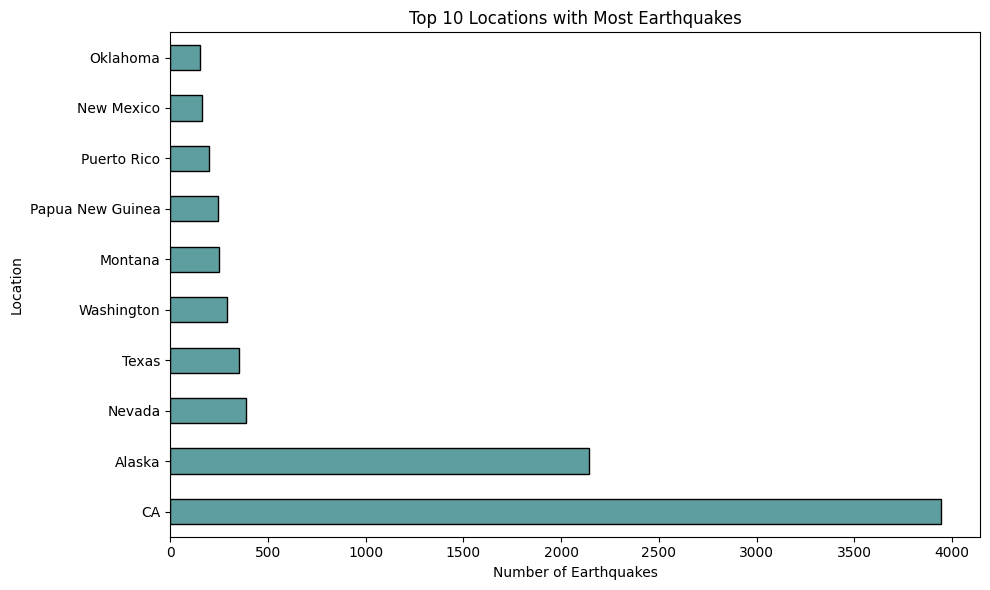

In [64]:
top_c = filtered_data['location'].value_counts().head(10)

plt.figure(figsize=(10, 6))
top_countries.plot(kind='barh', color='cadetblue', edgecolor='black')
plt.title('Top 10 Locations with Most Earthquakes')
plt.xlabel('Number of Earthquakes')
plt.ylabel('Location')
plt.tight_layout()
plt.savefig('top_locations_earthquakes.png')
plt.show()

## 🌐 4. Interactive Geospatial Map
Circle markers represent earthquake locations. Colors indicate magnitude level:
- Green = <4
- Orange = 4–5.9
- Red = ≥6

In [66]:
def get_color(mag):
    if mag < 4:
        return 'green'
    elif 4 <= mag < 6:
        return 'orange'
    else:
        return 'red'

def get_radius(mag):
    return max(2, min(12, mag * 2))

earthquake_map = folium.Map(
    location=[filtered_data['latitude'].mean(), filtered_data['longitude'].mean()],
    zoom_start=2,
    tiles='CartoDB positron'
)

for _, row in filtered_data.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=get_radius(row['mag']),
        color=get_color(row['mag']),
        fill=True,
        fill_opacity=0.6,
        popup=folium.Popup(f"""
            <b>Magnitude:</b> {row['mag']}<br>
            <b>Depth:</b> {row['depth']} km<br>
            <b>Location:</b> {row['place']}
        """, max_width=250)
    ).add_to(earthquake_map)

earthquake_map.save('earthquake_map_final.html')
earthquake_map

## ⏱️ 5. Time Series Analysis

/var/folders/dt/s32t0wdx22q3rkl0pp7y4zdm0000gn/T/ipykernel_53511/993902892.py:1: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  filtered_data['year_month'] = filtered_data['time'].dt.to_period('M')


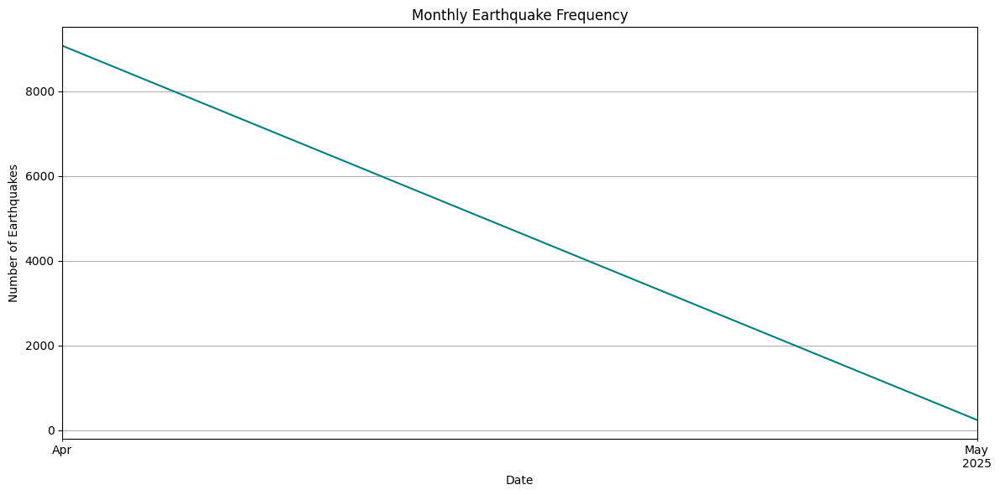

In [68]:
filtered_data['year_month'] = filtered_data['time'].dt.to_period('M')
monthly_counts = filtered_data.groupby('year_month').size()

monthly_counts.plot(kind='line', figsize=(12, 6), color='teal')
plt.title('Monthly Earthquake Frequency')
plt.xlabel('Date')
plt.ylabel('Number of Earthquakes')
plt.grid(True)
plt.tight_layout()
plt.savefig('monthly_earthquake_trend.png')
plt.show()

## 💾 6. Export Cleaned Dataset

In [69]:
filtered_data.to_csv('cleaned_earthquakes.csv', index=False)

## 📌 7. Conclusions

- Most earthquakes are moderate (mag 4–6), with very few extreme events.
- Seismic activity is highest in tectonic regions like the Pacific Ring of Fire.
- Countries like **Japan**, **Chile**, and **Indonesia** are among the most affected.
- Deeper earthquakes do not necessarily imply stronger magnitudes in this dataset.
- The interactive map and time series give deeper insight into global trends and clusters.